In [35]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from math import sqrt
from sklearn.metrics import r2_score
data=pd.read_csv('urban.csv')
data.head()

,Hour (Coded),Immobilized bus,Broken Truck,Vehicle excess,Accident victim,Running over,Fire vehicles,Occurrence involving freight,Incident involving dangerous freight,Lack of electricity,Fire,Point of flooding,Manifestations,Defect in the network of trolleybuses,Tree on the road,Semaphore off,Intermittent Semaphore,Slowness,Unnamed: 18
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,1.0
1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,6.0
2,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,7.0
3,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9,2.0
4,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,1.0


In [19]:
data.shape

(135, 19)

In [20]:
data.isnull().sum()


Hour (Coded)                              0
Immobilized bus                           0
Broken Truck                              0
Vehicle excess                            0
Accident victim                           0
Running over                              0
Fire vehicles                             0
Occurrence involving freight              0
Incident involving dangerous freight      0
Lack of electricity                       0
Fire                                      0
Point of flooding                         0
Manifestations                            0
Defect in the network of trolleybuses     0
Tree on the road                          0
Semaphore off                             0
Intermittent Semaphore                    0
Slowness                                  0
Unnamed: 18                              13
dtype: int64

In [22]:
data['Slowness'].value_counts()

8     20
7     15
6     12
9     12
10    12
11    11
5     11
12     7
4      6
13     5
17     5
15     4
3      3
19     3
22     2
18     2
14     1
16     1
20     1
21     1
23     1
Name: Slowness, dtype: int64

In [23]:
data.describe()

,Hour (Coded),Immobilized bus,Broken Truck,Vehicle excess,Accident victim,Running over,Fire vehicles,Occurrence involving freight,Incident involving dangerous freight,Lack of electricity,Fire,Point of flooding,Manifestations,Defect in the network of trolleybuses,Tree on the road,Semaphore off,Intermittent Semaphore,Slowness,Unnamed: 18
count,135.00000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,122.000000
mean,14.00000,0.340741,0.874074,0.029630,0.422222,0.118519,0.007407,0.007407,0.007407,0.118519,0.007407,0.118519,0.051852,0.229630,0.044444,0.125926,0.014815,9.622222,4.754098
std,7.81789,0.659749,1.102437,0.170195,0.696116,0.346665,0.086066,0.086066,0.086066,0.504485,0.086066,0.712907,0.222554,0.818998,0.206848,0.464077,0.121261,4.377464,2.645162
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000
25%,7.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,3.000000
50%,14.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,4.000000
75%,21.00000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.000000,7.000000
max,27.00000,4.000000,5.000000,1.000000,3.000000,2.000000,1.000000,1.000000,1.000000,4.000000,1.000000,7.000000,1.000000,8.000000,1.000000,4.000000,1.000000,23.000000,9.000000


In [24]:
y=data.pop('Slowness')
X=data


In [25]:
features=list(X.columns)
features

['Hour (Coded)',
 'Immobilized bus',
 'Broken Truck',
 'Vehicle excess',
 'Accident victim',
 'Running over',
 'Fire vehicles',
 'Occurrence involving freight',
 'Incident involving dangerous freight',
 'Lack of electricity',
 'Fire',
 'Point of flooding',
 'Manifestations',
 'Defect in the network of trolleybuses',
 'Tree on the road',
 'Semaphore off',
 'Intermittent Semaphore',
 'Unnamed: 18']

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


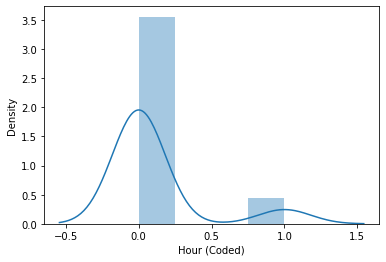

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


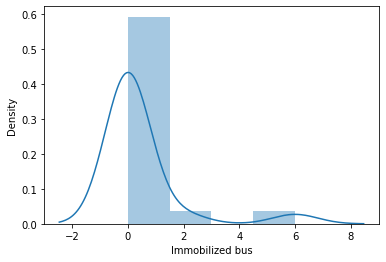

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


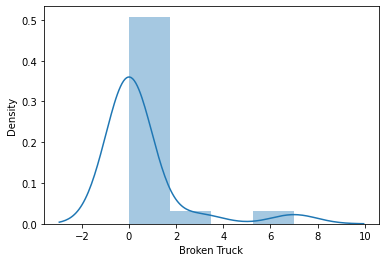

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


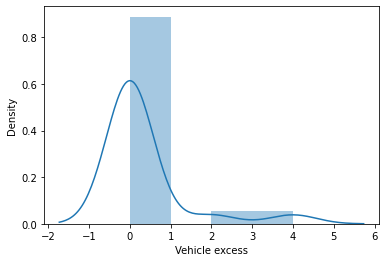

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


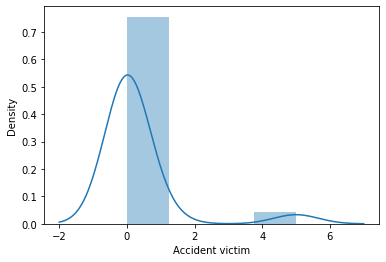

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


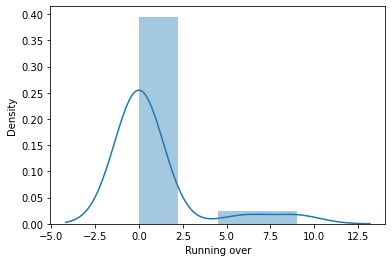

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


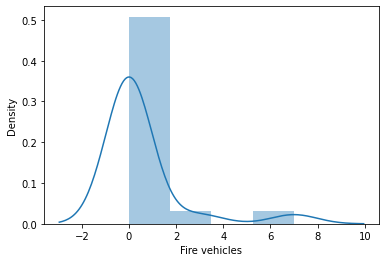

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


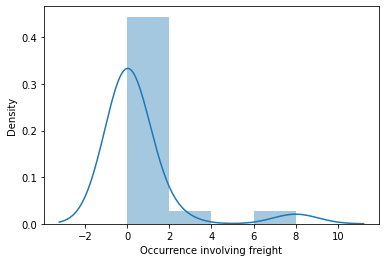

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


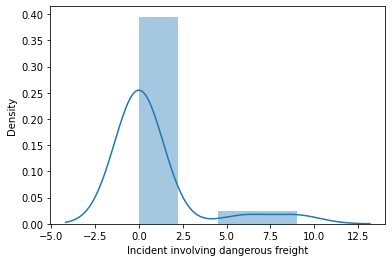

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


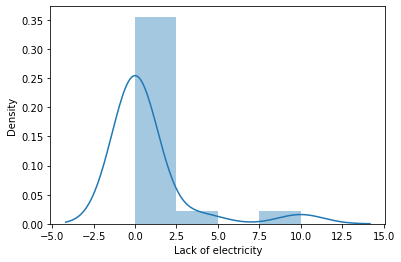

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


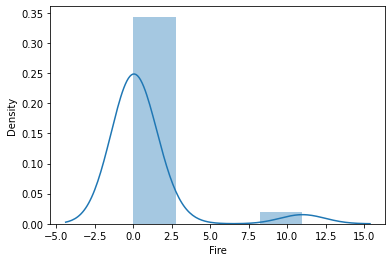

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


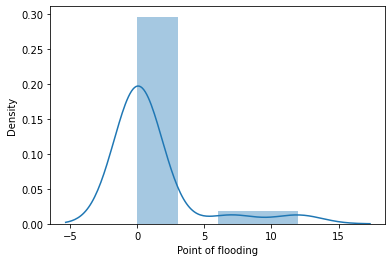

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


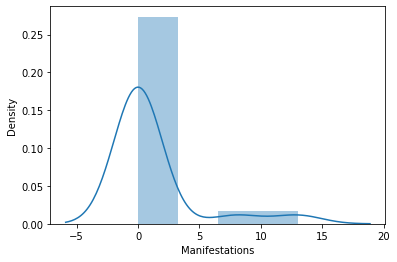

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


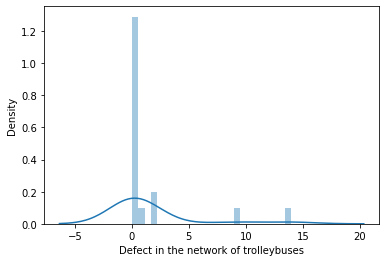

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


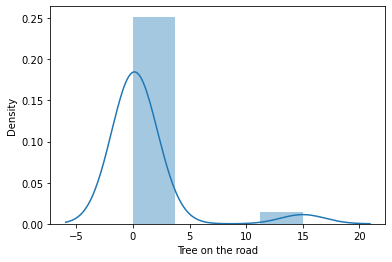

c:\users\vish\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


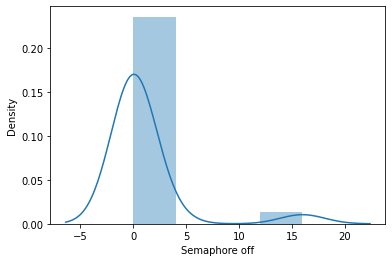

In [27]:
x2 = X.values

for i in range(0,16):
        sns.distplot(x2[i])
        plt.xlabel(features[i])
        plt.show()

<Figure size 1440x1440 with 0 Axes>

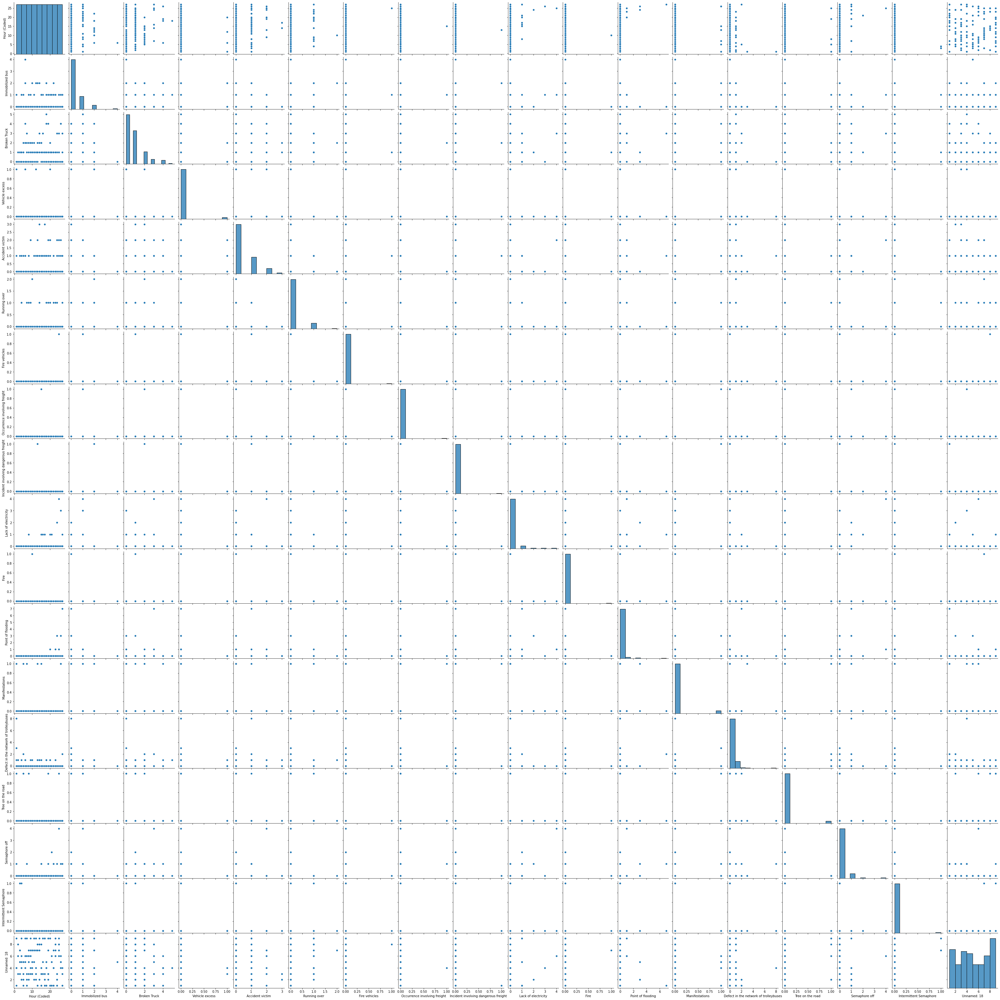

In [28]:
x2 = pd.DataFrame(X)

plt.figure(figsize=(20,20))
sns.pairplot(data=x2)
plt.show()

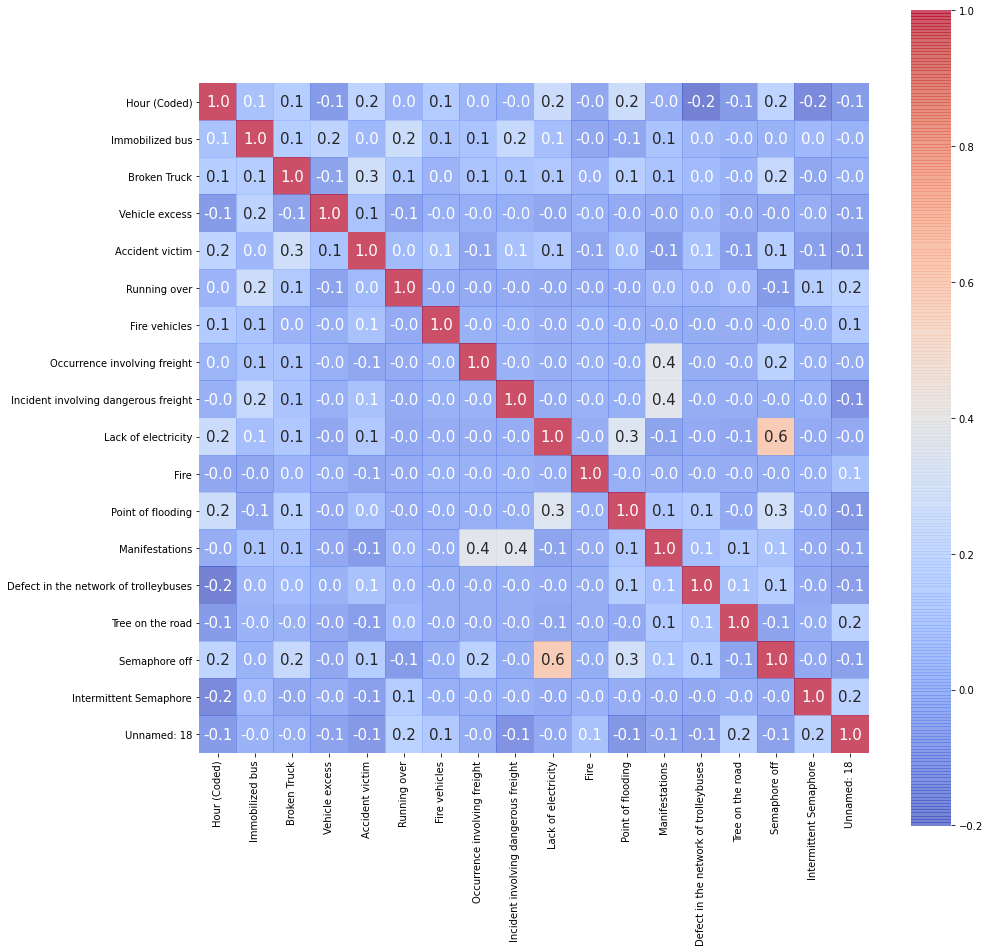

In [29]:
coreleation= X.corr()
plt.figure(figsize=(15,15))
sns.heatmap(coreleation,cbar=True,square=True,annot=True,fmt='.1f',annot_kws={'size': 15},xticklabels=features,yticklabels=features,alpha=0.7,cmap= 'coolwarm')
plt.show()

In [36]:
#SVM
rmse=[]
Scores=[]
for i in range(5):   
    print("day :",(i+1))
    X_train, X_test, y_train, y_test = train_test_split(X.iloc[0+27*i:27*(i+1),:], y.iloc[0+27*i:27*(i+1)], test_size=0.20, random_state=42)
    y_train = y_train.values.ravel()
    y_test = y_test.values.ravel()
    print('Shape of X_train = ' + str(X_train.shape))
    print('Shape of X_test = ' + str(X_test.shape))
    print('Shape of y_train = ' + str(y_train.shape))
    print('Shape of y_test = ' + str(y_test.shape))
    sc=SVR(kernel='rbf', C=200, gamma=0.01, epsilon=.4)
    sc.fit(X_train,y_train)
    y_pred=sc.predict(X_test)
    rmse.append(sqrt(mean_squared_error(y_test, y_pred)))
    Scores.append(r2_score(y_test, y_pred))
    r2=r2_score(y_test, y_pred)
    print('root mean square error %.2f'%sqrt(mean_squared_error(y_test, y_pred)))
    print('r2 score value: %.2f'%r2)    

day : 1


AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

In [32]:
#LVQ
def LVQ(X, T, lr=0.01, epoch=100):
    W_ = np.random.uniform(size = X.T.shape)
    for iter in range(epoch):
        for i in range(X.shape[0]):
            temp=[]
            print("for inputs" ,X[i,:] ," Target is: ",T[i])
            for j in range(W_.shape[1]):
                sum=0
                for k in range(W_.shape[0]):
                    sum =sum+((X[i][k]-W_[k][j])**2)
                temp.append(sum)
            index = np.argmin(temp)
            print("neuron at position ",index," won")
            if(index==T[i]):
                for p in range(W_.shape[0]):
                    W_[p][index] =W_[p][index] +lr *(X[i][p] -W_[p][index])
            else:
                for p in range(W_.shape[0]):
                    W_[p][index] =W_[p][index] -lr *(X[i][p] -W_[p][index])
 
            print(W_)
        lr=lr*0.5

data = pd.read_csv('urban.csv')
lr=0.01
epoch=100
T  = data.pop('Slowness')
T=T.values
X  = data.values
LVQ(X, T, lr, epoch)

for inputs [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  4
neuron at position  66  won
[[0.73283362 0.91229169 0.82169694 ... 0.14967149 0.57990345 0.01471271]
 [0.29723587 0.03666757 0.22592585 ... 0.17507968 0.99859322 0.06758044]
 [0.59407839 0.042776   0.20228415 ... 0.65415484 0.82732671 0.36840923]
 ...
 [0.79366043 0.70446156 0.063581   ... 0.81996105 0.46842282 0.11362211]
 [0.68703541 0.81170629 0.4920929  ... 0.05013756 0.72131213 0.9222172 ]
 [0.42135906 0.18558299 0.02109943 ... 0.5688046  0.84397009 0.87874719]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  6
neuron at position  57  won
[[0.73283362 0.91229169 0.82169694 ... 0.14967149 0.57990345 0.01471271]
 [0.29723587 0.03666757 0.22592585 ... 0.17507968 0.99859322 0.06758044]
 [0.59407839 0.042776   0.20228415 ... 0.65415484 0.82732671 0.36840923]
 ...
 [0.79366043 0.70446156 0.063581   ... 0.81996105 0.46842282 0.11362211]
 [0.68703541 0.81170629 0.4920929  ... 

neuron at position  0  won
[[-0.09624043  0.91229169  0.82169694 ...  0.14967149  0.57990345
   0.01471271]
 [ 0.26802013  0.03666757  0.22592585 ...  0.17507968  0.99859322
   0.06758044]
 [ 0.62114969  0.042776    0.20228415 ...  0.65415484  0.82732671
   0.36840923]
 ...
 [ 0.87484662  0.70446156  0.063581   ...  0.81996105  0.46842282
   0.11362211]
 [ 0.76650366  0.81170629  0.4920929  ...  0.05013756  0.72131213
   0.9222172 ]
 [        nan  0.18558299  0.02109943 ...  0.5688046   0.84397009
   0.87874719]]
for inputs [14.  0.  2.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  7
neuron at position  0  won
[[-0.23720284  0.91229169  0.82169694 ...  0.14967149  0.57990345
   0.01471271]
 [ 0.27070033  0.03666757  0.22592585 ...  0.17507968  0.99859322
   0.06758044]
 [ 0.60736119  0.042776    0.20228415 ...  0.65415484  0.82732671
   0.36840923]
 ...
 [ 0.88359508  0.70446156  0.063581   ...  0.81996105  0.46842282
   0.11362211]
 [ 0.77416869  0.81170629

neuron at position  0  won
[[-8.44679449  0.91229169  0.82169694 ...  0.14967149  0.57990345
   0.01471271]
 [ 0.22140556  0.03666757  0.22592585 ...  0.17507968  0.99859322
   0.06758044]
 [ 0.26364257  0.042776    0.20228415 ...  0.65415484  0.82732671
   0.36840923]
 ...
 [ 1.24503537  0.70446156  0.063581   ...  0.81996105  0.46842282
   0.11362211]
 [ 1.16297527  0.81170629  0.4920929  ...  0.05013756  0.72131213
   0.9222172 ]
 [        nan  0.18558299  0.02109943 ...  0.5688046   0.84397009
   0.87874719]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 7.]  Target is:  5
neuron at position  0  won
[[-8.56126243  0.91229169  0.82169694 ...  0.14967149  0.57990345
   0.01471271]
 [ 0.22361961  0.03666757  0.22592585 ...  0.17507968  0.99859322
   0.06758044]
 [ 0.26627899  0.042776    0.20228415 ...  0.65415484  0.82732671
   0.36840923]
 ...
 [ 1.25748573  0.70446156  0.063581   ...  0.81996105  0.46842282
   0.11362211]
 [ 1.16460502  0.81170629  0.4920929  ...  

for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-2.44757631e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [ 9.97264434e-02  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.42980907e-01  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 2.06621526e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 1.99326523e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  8
neuron at position  0  won
[[-2.46331419e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [ 1.00225076e-01  3.66675666e-02  2.259

neuron at position  0  won
[[-3.75157815e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [ 2.54163242e-02  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-5.96652080e-01  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 2.76221223e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 2.67006227e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  8
neuron at position  0  won
[[-3.77633604e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [ 2.55434059e-02  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-4.67670986e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.44142540e-02  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-8.81114854e-01  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 3.20703706e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 3.14239705e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  5.]  Target is:  10
neuron at position  0  won
[[-4.70909341e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.45863253e-02  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [22.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-5.74519749e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-1.11221603e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-1.20757218e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 3.73560778e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 3.68616724e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  8.]  Target is:  17
neuron at position  0  won
[[-5.78542348e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-6.41973786e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-1.37318871e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-1.35707832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 4.07127960e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 4.02267435e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-6.44228720e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-1.37662168e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-7.16314093e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-1.95319308e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-1.58655005e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 4.46013734e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 4.40948994e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  6
neuron at position  0  won
[[-7.18329878e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-1.95807606e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-1.59551643e+00 

neuron at position  0  won
[[-8.09167182e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-2.57851599e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-1.86783175e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 4.91706138e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 4.88219206e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-8.11765100e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-2.60996228e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-8.97653009e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.10539334e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.12255359e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 5.35719303e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 5.33473395e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]  Target is:  8
neuron at position  0  won
[[-8.98875076e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.10927509e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.12520678e+00 

neuron at position  0  won
[[-9.45160348e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.40049578e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.23930707e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 5.60235156e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 5.58012352e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-9.46554298e+01  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.40474640e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.00156927e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.74136195e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.41964677e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 5.87805257e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 5.86474976e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 7.]  Target is:  5
neuron at position  0  won
[[-1.00285873e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-3.74603865e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.42267133e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.06858485e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.20694339e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.62318818e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.21934316e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.21031123e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.07019558e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.21220207e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

   8.43970093e-01  8.78747195e-01]]
for inputs [11.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]  Target is:  8
neuron at position  0  won
[[-1.10718438e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.42899146e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.71978115e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.41349240e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.40737012e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.10795137e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5

neuron at position  0  won
[[-1.12386515e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.54405037e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.77268745e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.49819768e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.49136916e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 4. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  7
neuron at position  0  won
[[-1.12460506e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.54689040e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.77692038e+00 

   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  3.  0.  2.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.  4.  0.  6.]  Target is:  22
neuron at position  0  won
[[-1.13994362e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.63252560e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.82516675e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.57427249e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.57299486e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  0.  0.  0.  0.  0.  0.  0.  3.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  23
neuron at position  0  won
[[-1.14081859e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
  

neuron at position  0  won
[[-1.15158170e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.71374005e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.85614896e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.63617668e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.63425810e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  10
neuron at position  0  won
[[-1.15238894e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.71668614e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.16497283e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.79879879e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.89679223e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.70096876e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.70091257e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  5
neuron at position  0  won
[[-1.16571968e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.80179804e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.89922773e+00 

neuron at position  0  won
[[-1.18641954e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.94044565e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.96064685e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.80820340e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.81065803e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.18679967e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-4.94198954e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-2.96157206e+00 

for inputs [20.  0.  1.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.20505870e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.05121452e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.01072386e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 6.90429116e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 6.90709432e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.20550091e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

for inputs [15.  1.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.23731942e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.26422730e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.11025576e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.06609468e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.07243986e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  10
neuron at position  0  won
[[-1.23775609e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.25240373e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.35424840e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.14914385e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.14157804e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.14909400e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  4.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  9
neuron at position  0  won
[[-1.25262911e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.35508501e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [18.  2.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  9
neuron at position  0  won
[[-1.27013734e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.47114747e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.20371814e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.23048686e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.23982736e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  3.]  Target is:  11
neuron at position  0  won
[[-1.27036549e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5

neuron at position  0  won
[[-1.27981080e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.52648114e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.23049987e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.27916850e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.28912265e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.27992329e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.52691290e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.28441661e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.55751335e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.24391533e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.30165999e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.31242885e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  5
neuron at position  0  won
[[-1.28451930e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.55794753e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.24424689e+00 

neuron at position  0  won
[[-1.28825069e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.58112000e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.25490067e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.32105323e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.33216405e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  8
neuron at position  0  won
[[-1.28830882e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.58133801e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.29054500e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.59671084e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.26156373e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.33274842e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.34387709e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 2.]  Target is:  6
neuron at position  0  won
[[-1.29059814e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.59692946e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.26176926e+00 

neuron at position  0  won
[[-1.29313261e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.61342117e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.26926708e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.34554498e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.35704562e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  1.  0.  0.  0.  0.  5.]  Target is:  21
neuron at position  0  won
[[-1.29319328e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.61364044e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.29540239e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.62660936e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.27569441e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.35694027e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.36869372e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  11
neuron at position  0  won
[[-1.29543238e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.62671925e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.29697731e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.63706614e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28045152e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.36479590e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.37673802e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  0.  0.  0.  0.  0.  0.  0.  3.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  23
neuron at position  0  won
[[-1.29700772e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.63737155e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28051559e+00  4.27760

neuron at position  0  won
[[-1.29808806e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64440259e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28383589e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37049323e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.38248374e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.29811576e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64490346e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.29867325e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64803055e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28534632e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37336673e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.38544019e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  6
neuron at position  0  won
[[-1.29868691e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64808570e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.29897271e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64957961e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28609827e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37487899e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.38695493e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  9
neuron at position  0  won
[[-1.29898579e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.64963478e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28613036e+00 

for inputs [15.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  8
neuron at position  0  won
[[-1.29913608e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65092534e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28654198e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37573352e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.38782063e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.29915033e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.29941855e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65281047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28748670e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37716446e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.38925393e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  6
neuron at position  0  won
[[-1.29943212e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65286568e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28753834e+00 

neuron at position  0  won
[[-1.29977129e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65477672e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28849451e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.37888760e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.39104840e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.29978466e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65483194e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.28852663e+00 

neuron at position  0  won
[[-1.30026074e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65827262e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29004846e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38138080e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.39357505e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30027491e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.65842553e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  6
neuron at position  0  won
[[-1.30065525e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66047607e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29104933e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38332429e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.39556089e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30066175e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.4

neuron at position  0  won
[[-1.30104166e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66302197e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29221652e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38525855e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.39753750e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  5
neuron at position  0  won
[[-1.30104821e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66304962e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29223259e+00 

neuron at position  0  won
[[-1.30145290e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66571419e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29342321e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38733422e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.39965086e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  5
neuron at position  0  won
[[-1.30145647e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66572803e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30156601e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66642541e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29373179e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38790894e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40022898e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30156970e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66643924e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29373983e+00  4.27760

neuron at position  0  won
[[-1.30171031e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66728562e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29415916e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38862651e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40096488e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30171369e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66729945e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29416720e+00 

neuron at position  0  won
[[-1.30192659e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66869126e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29478651e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.38970986e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40206716e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  6
neuron at position  0  won
[[-1.30192820e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66869818e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29479053e+00 

for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  9
neuron at position  0  won
[[-1.30200140e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66917193e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29501561e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39009531e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40245448e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30200320e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5

neuron at position  0  won
[[-1.30206756e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66963551e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29521083e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39041690e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40278761e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 8. 0. 1. 0. 4.]  Target is:  3
neuron at position  0  won
[[-1.30206917e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66964243e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29521485e+00 

[[-1.30212167e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66997214e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29536727e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39069046e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40306775e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30212252e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.66997560e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29536928e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30217091e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67028191e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29550920e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39094186e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40332018e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [11.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30217177e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67028537e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30220449e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67049887e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29560883e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39110779e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40349128e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  2.  1.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  13
neuron at position  0  won
[[-1.30220542e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67051454e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29561145e+00  4.27760

neuron at position  0  won
[[-1.30223937e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67071493e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29570812e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39128232e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40366977e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30223981e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67072276e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30225579e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67082474e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29575296e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39136547e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40375337e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  3.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  15
neuron at position  0  won
[[-1.30225626e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67082647e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30226721e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67089110e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29579010e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39142290e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40381181e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  6.]  Target is:  19
neuron at position  0  won
[[-1.30226768e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67089588e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30227817e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67096488e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29582226e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39147746e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40386799e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30227863e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67096966e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30228475e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67101220e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29584284e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39151069e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40390188e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30228518e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67101393e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29584446e+00

neuron at position  0  won
[[-1.30229375e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67106818e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29586754e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39155458e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40394707e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30229395e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67106904e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29586804e+00 

neuron at position  0  won
[[-1.30229810e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67108853e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29587851e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39157714e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40396967e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30229834e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67108940e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30231524e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67120028e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29592964e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39166343e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40405748e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  11
neuron at position  0  won
[[-1.30231547e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67120267e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29593030e+00  4.27760

neuron at position  0  won
[[-1.30232336e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67125476e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29595318e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39170369e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40409872e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]  Target is:  9
neuron at position  0  won
[[-1.30232346e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67125519e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29595344e+00 

neuron at position  0  won
[[-1.30233036e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67129694e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29597309e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39173963e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40413480e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  2.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  2.]  Target is:  6
neuron at position  0  won
[[-1.30233047e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67129738e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30233619e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67133666e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29599085e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39176868e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40416466e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30233630e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67133709e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29599117e+00  4.27760

neuron at position  0  won
[[-1.30234411e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67138553e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29601325e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39180820e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40420497e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 6.  2.  2.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0. nan]  Target is:  9
neuron at position  0  won
[[-1.30234416e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67138651e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30234645e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67140006e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29601970e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39182001e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40421698e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  8
neuron at position  0  won
[[-1.30234648e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67140036e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29601976e+00  4.277600

neuron at position  0  won
[[-1.30234748e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67140654e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29602296e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39182513e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40422218e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  3.  0.  2.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.  4.  0.  6.]  Target is:  22
neuron at position  0  won
[[-1.30234751e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67140684e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30234868e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67141474e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29602662e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39183120e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40422838e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30234871e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67141504e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30234938e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67141859e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29602840e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39183465e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40423191e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  8.]  Target is:  11
neuron at position  0  won
[[-1.30234939e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67141864e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29602845e+00  4.27760

neuron at position  0  won
[[-1.30235031e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142474e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603115e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39183935e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40423669e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  7
neuron at position  0  won
[[-1.30235032e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142480e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235091e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142879e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603296e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184231e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40423973e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  4
neuron at position  0  won
[[-1.30235092e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142881e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603298e+00 

[[-1.30235111e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142976e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603346e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184333e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424075e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235111e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67142979e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603347e+00  4.277600

for inputs [25.  1.  1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  16
neuron at position  0  won
[[-1.30235127e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143096e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603392e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184414e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424156e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235127e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235137e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143153e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603428e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184470e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424212e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  6
neuron at position  0  won
[[-1.30235138e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143156e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235150e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143230e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603463e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184529e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424275e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235151e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143233e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603464e+00 

neuron at position  0  won
[[-1.30235164e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143337e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603505e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184599e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424346e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  1.  0.  0.  0.  0.  5.]  Target is:  21
neuron at position  0  won
[[-1.30235165e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143340e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235178e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143432e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603550e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184672e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424420e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  0.  1.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  13
neuron at position  0  won
[[-1.30235179e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143435e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235210e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143622e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603640e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184833e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424584e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  1.  0.  0.  0.  0.  0.  0.  2.  0.  3.  0.  0.  0.  1.  0.  2.]  Target is:  20
neuron at position  0  won
[[-1.30235211e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143623e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603641e+00  4.27760

neuron at position  0  won
[[-1.30235231e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143757e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603700e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184934e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424688e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30235231e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143757e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603700e+00 

for inputs [26.  1.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235239e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143811e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603724e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39184979e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424733e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235240e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235250e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143881e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603757e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185034e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424789e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  12
neuron at position  0  won
[[-1.30235250e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143882e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235259e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143933e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603781e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185076e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424832e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  6
neuron at position  0  won
[[-1.30235259e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143934e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603781e+00 

for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  8.]  Target is:  11
neuron at position  0  won
[[-1.30235266e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143979e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603802e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185114e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424870e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235266e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

[[-1.30235268e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143993e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603808e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185124e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424881e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  2.  0.  1.  1.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  9.]  Target is:  13
neuron at position  0  won
[[-1.30235268e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67143993e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603809e+00  4.27760

neuron at position  0  won
[[-1.30235270e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144005e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603814e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185133e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424890e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  10
neuron at position  0  won
[[-1.30235270e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144005e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603814e+00

for inputs [13.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30235272e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144016e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603818e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185142e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424899e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  2.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  7
neuron at position  0  won
[[-1.30235272e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144022e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603822e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185147e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424904e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144022e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603822e+00 

neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144024e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603822e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185148e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424905e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144024e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144027e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603824e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185150e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424908e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  7.]  Target is:  9
neuron at position  0  won
[[-1.30235273e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144027e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144029e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603825e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185152e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424910e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144029e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603825e+00

neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144030e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603825e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185153e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424911e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  1.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144031e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144032e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603826e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185155e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424912e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235274e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144032e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144034e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603827e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185156e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424913e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  2.  0.  1.  1.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  9.]  Target is:  13
neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144034e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144035e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603827e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185157e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424914e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  7
neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144035e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144037e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603828e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185158e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424916e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 2. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  10
neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144037e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603828e+00

neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144038e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603829e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185159e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424916e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144038e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144039e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603829e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185160e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424917e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  6
neuron at position  0  won
[[-1.30235275e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144039e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144041e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603830e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185161e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424919e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  1.  1.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  12
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144041e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144042e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603831e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185162e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424920e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144042e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144043e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603831e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185163e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424921e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  8.]  Target is:  11
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144043e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144044e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185164e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424921e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  1.  1.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  12
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144044e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144045e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185164e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424922e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 4.]  Target is:  6
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144045e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00 

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144045e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185165e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424922e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  6
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144045e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185165e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424923e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  16
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185165e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424923e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235276e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603832e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424923e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144046e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424923e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  4.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [22.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  6.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

for inputs [7. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 9.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185166e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  6.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  7.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 9.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 7.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  4.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  0.  0.  0.  0.  0.  0.  0.  3.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  23
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  14
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  1.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  3.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  7.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 4. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

for inputs [15.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 2.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [13.  0.  1.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  2.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  2.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [20.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 9.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  16
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

for inputs [18.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  5.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5

for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  1.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  3.  0.  2.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.  4.  0.  6.]  Target is:  22
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 4.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  1.  0.  0.  0.  0.  5.]  Target is:  21
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  1.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  2.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  2.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  1.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  4.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 4. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  1.  0.  0.  0.  0.  0.  0.  2.  0.  3.  0.  0.  0.  1.  0.  2.]  Target is:  20
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  2.  0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  1.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 2. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 9.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 8. 0. 1. 0. 4.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

for inputs [6. 0. 4. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 2.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

for inputs [17.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  1.  0.  0.  0.  0.  0.  0.  2.  0.  3.  0.  0.  0.  1.  0.  2.]  Target is:  20
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [9. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [24.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  18
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [11.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 8.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [8. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 4.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  8.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [11.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  2.  0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  1.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

for inputs [5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  4.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [15.  1.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.  0.  3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  3.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

for inputs [25.  1.  3.  0.  2.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.  4.  0.  6.]  Target is:  22
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  0.  0.  0.  0.  0.  0.  0.  3.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  23
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  3.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 2. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [13.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 8.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

for inputs [21.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  5.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [26.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  3.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  8.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [11.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  0.  0.  0. nan]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  9.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 6.  2.  2.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0. nan]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  8.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [6. 4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [7. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 9.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  2.  0.  1.  1.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  9.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 4.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  1.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  8.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  2.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  2.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [9. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66

for inputs [21.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  2.  1.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [24.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  18
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

for inputs [13.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  7.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5

for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  1.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [27.  0.  3.  0.  1.  0.  0.  0.  0.  1.  0.  7.  0.  2.  0.  1.  0.  1.]  Target is:  22
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 8. 0. 1. 0. 4.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.6

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [22.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  4.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

for inputs [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

for inputs [20.  0.  2.  0.  1.  1.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  9.]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  2.  0. nan]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

for inputs [10.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [11.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [11.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  4.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [ 1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  0.  0.  0. nan]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [9. 0. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [24.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  18
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 8.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


for inputs [7. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.2592

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  2.  2.  0.  1.  0.  0.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4.]  Target is:  3
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  3.  0.  1.  0.  0.  0.  0.  1.  0.  7.  0.  2.  0.  1.  0.  1.]  Target is:  22
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [12.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  2.  2.  0.  1.  0.  0.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [4. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 4.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  8.]  Target is:  17
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  3.  0.  2.  0.  0.  0.  0.  4.  0.  1.  0.  0.  0.  4.  0.  6.]  Target is:  22
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  1.  2.  0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  1.  0.  4.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 0. 2. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [16.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  2.  0. nan]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.259

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [27.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5.]  Target is:  9
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.277600

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [17.  0.  1.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  12
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [15.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [18.  2.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]  Target is:  6
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [8. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [25.  1.  1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  16
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [21.  0.  1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  2.  0. nan]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [13.  2.  2.  0.  1.  0.  0.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5.]  Target is:  5
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [20.  0.  0.  1.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan]  Target is:  13
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  2.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.]  Target is:  4
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]


neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [5. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [26.  1.  4.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  6.]  Target is:  15
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

for inputs [13.  2.  2.  0.  1.  0.  0.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  1.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [14.  0.  3.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.]  Target is:  10
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00 

for inputs [12.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.]  Target is:  7
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [13.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  7.]  Target is:  8
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [23.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  6.]  Target is:  19
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]

neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]
 [-3.29603833e+00  4.27760037e-02  2.02284151e-01 ...  6.54154844e-01
   8.27326715e-01  3.68409229e-01]
 ...
 [ 7.39185167e+00  7.04461560e-01  6.35809984e-02 ...  8.19961047e-01
   4.68422817e-01  1.13622111e-01]
 [ 7.40424924e+00  8.11706290e-01  4.92092899e-01 ...  5.01375612e-02
   7.21312130e-01  9.22217199e-01]
 [            nan  1.85582990e-01  2.10994268e-02 ...  5.68804604e-01
   8.43970093e-01  8.78747195e-01]]
for inputs [19.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  3.]  Target is:  11
neuron at position  0  won
[[-1.30235277e+02  9.12291692e-01  8.21696943e-01 ...  1.49671494e-01
   5.79903448e-01  1.47127109e-02]
 [-5.67144047e-01  3.66675666e-02  2.25925849e-01 ...  1.75079679e-01
   9.98593223e-01  6.75804430e-02]